# **Mid-term Project: Implementing Object Detection on a Dataset**

**0.1 Connect to Drive**

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**0.2 Importing Libraries**

In [2]:
import matplotlib.pyplot as plt
import cv2
import os
import zipfile
import cv2
import os
from tqdm import tqdm
import random

## **1. Selection of Dataset and Algorithm**

**1.1 Installing YOLO dependencies**

In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
%pip install -qr requirements.txt  # install

Cloning into 'yolov5'...
remote: Enumerating objects: 17022, done.
remote: Total 17022 (delta 0), reused 0 (delta 0), pack-reused 17022 (from 1)
Receiving objects: 100% (17022/17022), 15.62 MiB | 15.62 MiB/s, done.
Resolving deltas: 100% (11695/11695), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 879.0/879.0 kB 23.7 MB/s eta 0:00:00


**1.2 Unzipping PASCAL Dataset**

In [3]:
zip_ref = zipfile.ZipFile("/content/drive/MyDrive/PASCAL_data.zip", 'r')
zip_ref.extractall("/content/dataset2")
zip_ref.close()

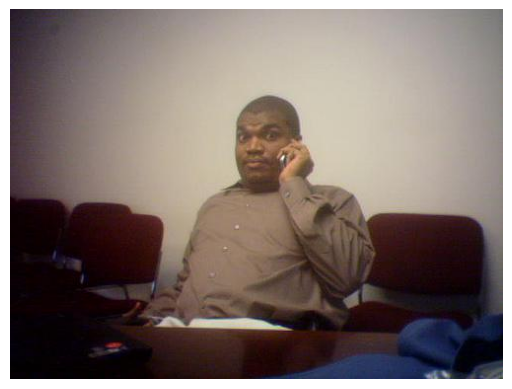

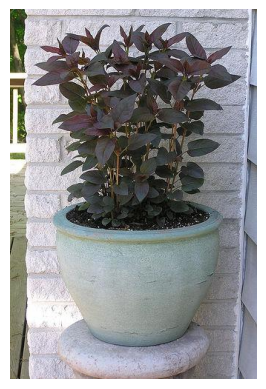

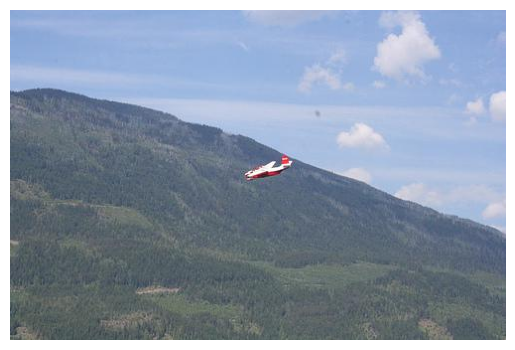

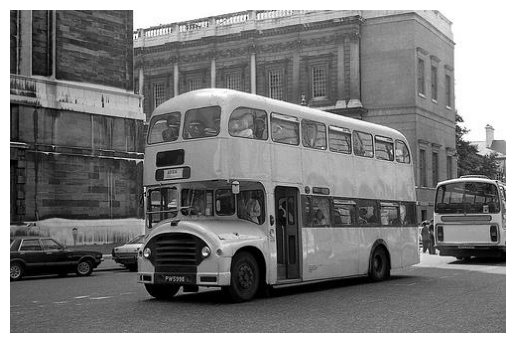

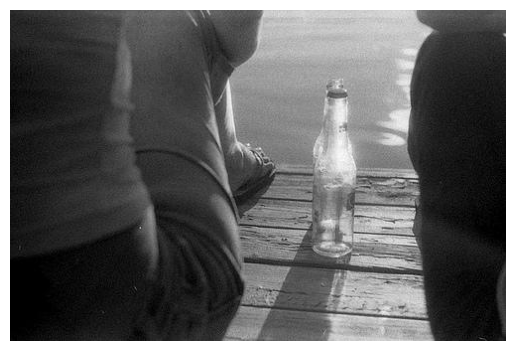

In [8]:
import matplotlib.pyplot as plt
import cv2
import os

# Assuming your images are in a folder named 'images' in the dataset2 folder
image_folder = '/content/dataset2/train/images'

# Get a list of image file names
image_files = [f for f in os.listdir(image_folder) if f.endswith('.jpg')]

# Randomly select five image files
selected_files = random.sample(image_files, 5)

# Display the selected images
for image_file in selected_files:
  image_path = os.path.join(image_folder, image_file)
  img = cv2.imread(image_path)
  img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  plt.imshow(img_rgb)
  plt.axis('off')
  plt.show()

## **2. Implementation**

**2.1 Preprocessing Dataset**

In [4]:
#Load Image
train_path = '/content/dataset2/train/images'
valid_path = '/content/dataset2/valid/images'

train_label_path = '/content/dataset2/train/labels'
valid_label_path = '/content/dataset2/valid/labels'

#Preprocess Image
def preprocess_images(image_dir, output_dir, size=(640, 640)):
  if not os.path.exists(output_dir):
    os.makedirs(output_dir)

  for filename in tqdm(os.listdir(image_dir)):
    if filename.endswith(('.jpg', '.jpeg', '.png')):
      img_path = os.path.join(image_dir, filename)
      img = cv2.imread(img_path)
      if img is not None:
        img = cv2.resize(img, size) # Resize
        img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) #Grayscale
        output_path = os.path.join(output_dir, filename)
        cv2.imwrite(output_path, img_gray)


# Preprocess training images
preprocess_images(train_path, '/content/preprocessed_train')

# Preprocess validation images
preprocess_images(valid_path, '/content/preprocessed_valid')

100%|██████████| 3422/3422 [00:27<00:00, 124.28it/s]


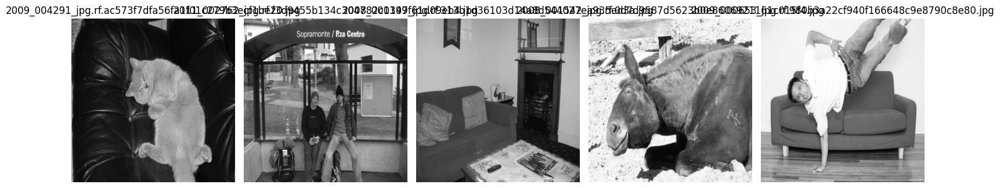

In [5]:
# Visualize dataset
# Paths to your preprocessed training and validation sets
preprocessed_train_path = '/content/preprocessed_train'
preprocessed_valid_path = '/content/preprocessed_valid'

# Get a list of all image files in the training directory
image_files = os.listdir(preprocessed_train_path)

# Choose 5 random images from the preprocessed training set
random_images = random.sample(image_files, 5)

# Create a figure to display the images
plt.figure(figsize=(15, 10))

# Load and display each selected image
for i, image_file in enumerate(random_images):
    image_path = os.path.join(preprocessed_train_path, image_file)

    # Load the image
    img = cv2.imread(image_path)

    # Display the image in a subplot
    plt.subplot(1, 5, i + 1)  # 1 row, 5 columns
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for displaying
    plt.title(image_file)  # Show the filename as the title
    plt.axis('off')  # Hide axes

# Show the figure with all images
plt.tight_layout()
plt.show()

**2.1 Model Building**

In [ ]:
#Load YOLO Model
import torch

# Load a pretrained YOLOv5 model
model = torch.hub.load('ultralytics/yolov5', 'yolov5s')

# Ultralytics YOLOv5 🚀, AGPL-3.0 license
'''
# Parameters
nc: 80 # number of classes
depth_multiple: 0.33 # model depth multiple
width_multiple: 0.50 # layer channel multiple
anchors:
  - [10, 13, 16, 30, 33, 23] # P3/8
  - [30, 61, 62, 45, 59, 119] # P4/16
  - [116, 90, 156, 198, 373, 326] # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [
    [-1, 1, Conv, [64, 6, 2, 2]], # 0-P1/2
    [-1, 1, Conv, [128, 3, 2]], # 1-P2/4
    [-1, 3, C3, [128]],
    [-1, 1, Conv, [256, 3, 2]], # 3-P3/8
    [-1, 6, C3, [256]],
    [-1, 1, Conv, [512, 3, 2]], # 5-P4/16
    [-1, 9, C3, [512]],
    [-1, 1, Conv, [1024, 3, 2]], # 7-P5/32
    [-1, 3, C3, [1024]],
    [-1, 1, SPPF, [1024, 5]], # 9
  ]

# YOLOv5 v6.0 head
head: [
    [-1, 1, Conv, [512, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 6], 1, Concat, [1]], # cat backbone P4
    [-1, 3, C3, [512, False]], # 13

    [-1, 1, Conv, [256, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 4], 1, Concat, [1]], # cat backbone P3
    [-1, 3, C3, [256, False]], # 17 (P3/8-small)

    [-1, 1, Conv, [256, 3, 2]],
    [[-1, 14], 1, Concat, [1]], # cat head P4
    [-1, 3, C3, [512, False]], # 20 (P4/16-medium)

    [-1, 1, Conv, [512, 3, 2]],
    [[-1, 10], 1, Concat, [1]], # cat head P5
    [-1, 3, C3, [1024, False]], # 23 (P5/32-large)

    [[17, 20, 23], 1, Detect, [nc, anchors]], # Detect(P3, P4, P5)
  ]
'''

/usr/local/lib/python3.10/dist-packages/torch/hub.py:330: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


YOLOv5 🚀 2024-11-4 Python-3.10.12 torch-2.5.0+cu121 CPU

100%|██████████| 14.1M/14.1M [00:00<00:00, 119MB/s]

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


'\n# Parameters\nnc: 80 # number of classes\ndepth_multiple: 0.33 # model depth multiple\nwidth_multiple: 0.50 # layer channel multiple\nanchors:\n  - [10, 13, 16, 30, 33, 23] # P3/8\n  - [30, 61, 62, 45, 59, 119] # P4/16\n  - [116, 90, 156, 198, 373, 326] # P5/32\n\n# YOLOv5 v6.0 backbone\nbackbone:\n  # [from, number, module, args]\n  [\n    [-1, 1, Conv, [64, 6, 2, 2]], # 0-P1/2\n    [-1, 1, Conv, [128, 3, 2]], # 1-P2/4\n    [-1, 3, C3, [128]],\n    [-1, 1, Conv, [256, 3, 2]], # 3-P3/8\n    [-1, 6, C3, [256]],\n    [-1, 1, Conv, [512, 3, 2]], # 5-P4/16\n    [-1, 9, C3, [512]],\n    [-1, 1, Conv, [1024, 3, 2]], # 7-P5/32\n    [-1, 3, C3, [1024]],\n    [-1, 1, SPPF, [1024, 5]], # 9\n  ]\n\n# YOLOv5 v6.0 head\nhead: [\n    [-1, 1, Conv, [512, 1, 1]],\n    [-1, 1, nn.Upsample, [None, 2, "nearest"]],\n    [[-1, 6], 1, Concat, [1]], # cat backbone P4\n    [-1, 3, C3, [512, False]], # 13\n\n    [-1, 1, Conv, [256, 1, 1]],\n    [-1, 1, nn.Upsample, [None, 2, "nearest"]],\n    [[-1, 4], 1, C

In [ ]:
#Organize File directories
#Create label folders if they don't exist
if not os.path.exists('/content/preprocessed_data/train/labels'):
    os.makedirs('/content/preprocessed_data/train/labels')

if not os.path.exists('/content/preprocessed_data/valid/labels'):
    os.makedirs('/content/preprocessed_data/valid/labels')

# Copy label files to the new folder structure
!cp -r /content/dataset2/train/labels /content/preprocessed_data/train/
!cp -r /content/dataset2/valid/labels /content/preprocessed_data/valid/

preprocessed_train_path = '/content/preprocessed_data/train/images'
preprocessed_valid_path = '/content/preprocessed_data/valid/images'

# Create the new folder structure for preprocessed images and labels
if not os.path.exists('/content/preprocessed_data/train/images'):
    os.makedirs('/content/preprocessed_data/train/images')
if not os.path.exists('/content/preprocessed_data/valid/images'):
    os.makedirs('/content/preprocessed_data/valid/images')

# Move preprocessed images to the new folder structure
!mv /content/preprocessed_train/* /content/preprocessed_data/train/images/
!mv /content/preprocessed_valid/* /content/preprocessed_data/valid/images/
!mv /content/preprocessed_data /content/yolov5/
!mv /content/dataset2 /content/yolov5/

**2.3 Training the Model**

In [ ]:
!python train.py --img 640 --batch 16 --epochs 10 --data dataset2/data.yaml --weights yolov5s.pt --cache

Streaming output truncated to the last 5000 lines.
        7/9      4.41G    0.04336    0.03192     0.0233         73        640:  11% 90/856 [00:42<05:30,  2.32it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
        7/9      4.41G    0.04339    0.03213     0.0233        101        640:  11% 91/856 [00:43<07:15,  1.76it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
        7/9      4.41G    0.04339    0.03219    0.02323         79        640:  11% 92/856 [00:43<06:04,  2.10it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
        7/9      4.41G    0.04339 

In [ ]:
#Saving the model
from google.colab import files
import shutil

shutil.make_archive("yolov5_runs_train", 'zip', "/content/yolov5/runs/train")
files.download("yolov5_runs_train.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

**2.4 Testing**

In [ ]:
#Unzip for testing
zip_ref = zipfile.ZipFile("/content/drive/MyDrive/yolov5_runs_train.zip", 'r')
zip_ref.extractall("/content/yolov5_runs_train2")
zip_ref.close()

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-11-4 Python-3.10.12 torch-2.5.0+cu121 CPU

Fusing layers... 
Model summary: 157 layers, 7064065 parameters, 0 gradients, 15.9 GFLOPs
Adding AutoShape... 
/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
image 1/1: 333x500 1 aeroplane
Speed: 35.0ms pre-process, 346.9ms inference, 32.2ms NMS per image at shape (1, 3, 448, 640)


Results for 2011_001962_jpg.rf.0f9077ac80d55ee8026b79167ac8e179.jpg:


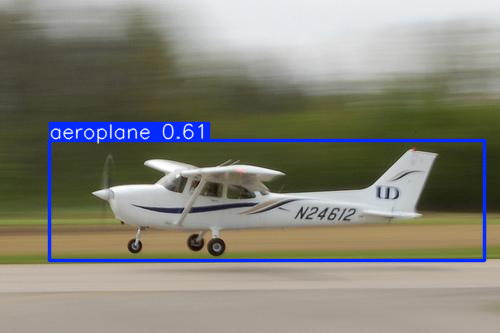

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
image 1/1: 375x500 3 chairs, 1 pottedplant, 1 tvmonitor
Speed: 9.1ms pre-process, 333.5ms inference, 4.4ms NMS per image at shape (1, 3, 480, 640)


Results for 2010_000601_jpg.rf.641a4b991b76ee7e674c92a7724736b8.jpg:


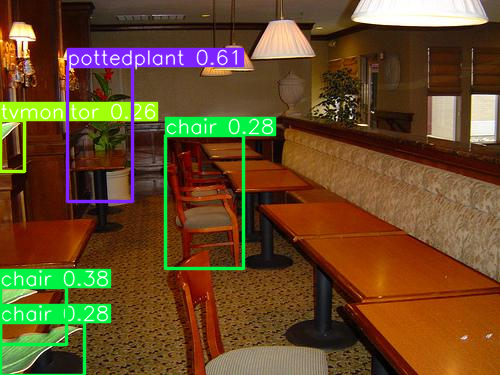

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
image 1/1: 375x500 1 bird, 1 cat
Speed: 8.5ms pre-process, 379.2ms inference, 1.1ms NMS per image at shape (1, 3, 480, 640)


Results for 2008_006347_jpg.rf.ee8b6e2b998a3746664979fb9c4fff61.jpg:


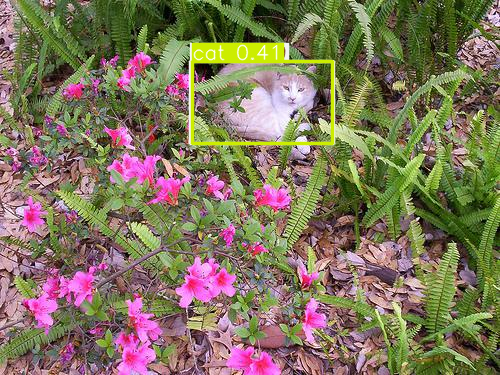

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
image 1/1: 375x500 1 chair, 1 person, 2 sofas
Speed: 7.1ms pre-process, 409.5ms inference, 1.1ms NMS per image at shape (1, 3, 480, 640)


Results for 2009_001313_jpg.rf.ebdd3f1a1b55f705eabb4666550b1903.jpg:


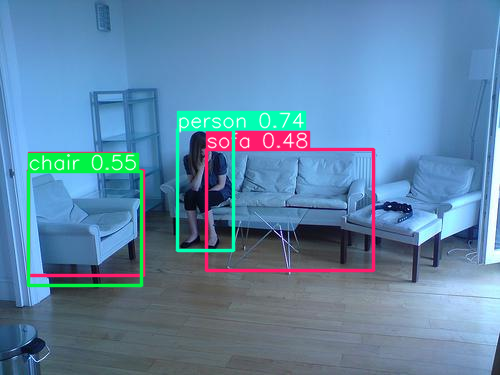

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
image 1/1: 500x375 1 person
Speed: 11.2ms pre-process, 373.7ms inference, 1.0ms NMS per image at shape (1, 3, 640, 480)


Results for 2011_005150_jpg.rf.cb834be9e279e5c1fd3be446eeab0cc2.jpg:


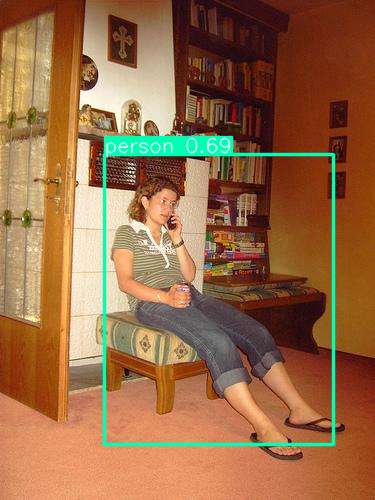

In [ ]:
# Load the trained model from the runs/train directory
model = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/yolov5_runs_train2/exp/weights/best.pt')
data_path = '/content/yolov5/dataset2/valid/images'

# Get a list of all image files in the directory
image_files = os.listdir(data_path)

# Choose 5 random images from the preprocessed test set
random_images = random.sample(image_files, 5)

# Perform inference and display results for each selected image
for image_file in random_images:
    image_path = os.path.join(data_path, image_file)

    # Perform inference
    results = model(image_path)  # Replace with your model's inference method

    # Display the results
    print(f"Results for {image_file}:")
    results.print()  # Print results to screen
    results.show()   # Show the image with detections

In [ ]:
%cd /content/yolov5/

/content/yolov5


In [ ]:
#Testing detection for all validation images
!python detect.py --weights /content/yolov5_runs_train2/exp/weights/best.pt --img 640 --conf 0.4 --source /content/yolov5/dataset2/valid/images --name yolov5s_results

detect: weights=['/content/yolov5_runs_train2/exp/weights/best.pt'], source=/content/yolov5/dataset2/valid/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=yolov5s_results, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-378-g2f74455a Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7064065 parameters, 0 gradients, 15.9 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/3422 /content/yolov5/dataset2/valid/images/2007_000039_jpg.rf.eb878cf899cc46bcc3a2d91c6dfede0d.jpg: 480x640 1 tvmonitor, 31.2ms
image 2/3422 /content/yolov5/dataset2/valid/images/2007_000042_jpg.rf.21843925939a653bd753

## **3. Evaluation**

In [ ]:
# Download the SSD MobileNet V2 COCO model
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz
!tar -xzvf ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz

--2024-11-04 08:47:16--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 142.250.101.207, 142.251.2.207, 142.250.141.207, ...
Connecting to download.tensorflow.org (download.tensorflow.org)|142.250.101.207|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 46042990 (44M) [application/x-tar]
Saving to: ‘ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz’

ssd_mobilenet_v2_32 100%[===================>]  43.91M   139MB/s    in 0.3s    

2024-11-04 08:47:17 (139 MB/s) - ‘ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz’ saved [46042990/46042990]

ssd_mobilenet_v2_320x320_coco17_tpu-8/
ssd_mobilenet_v2_320x320_coco17_tpu-8/checkpoint/
ssd_mobilenet_v2_320x320_coco17_tpu-8/checkpoint/ckpt-0.data-00000-of-00001
ssd_mobilenet_v2_320x320_coco17_tpu-8/checkpoint/checkpoint
ssd_mobilenet_v2_320x320_coco17_tpu-8/checkpoint/ckpt-0.index
ssd_mobilenet_v2_320x320

In [ ]:
#Importing Libraies
import tensorflow as tf
import cv2
import numpy as np
import os
from tqdm import tqdm
import json
import time
import re
import matplotlib.pyplot as plt
from shapely.geometry import box
from shapely.ops import cascaded_union
import yaml

In [ ]:
#Initialize paths
ssd_model = tf.saved_model.load('/content/ssd_mobilenet_v2_320x320_coco17_tpu-8/saved_model')

ssd_valid_path = "/content/dataset2/valid/images" # Validation path
output_folder = "/content/saved_detections"  # Folder to save images with detections
predictions_file = "/content/predictions.json"  # File to save predictions

In [ ]:
#Prepare images for ssd evaluation
def prepare_images_for_ssd_prediction(image_dir, size=(320, 320)):
    input_tensors = []

    for filename in tqdm(os.listdir(image_dir)):
        if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
            img_path = os.path.join(image_dir, filename)
            img = cv2.imread(img_path)

            if img is not None:
                img = cv2.resize(img, size)
                img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                input_tensor = tf.convert_to_tensor(img_rgb)
                input_tensor = input_tensor[tf.newaxis, ...]
                input_tensors.append((input_tensor, img, filename))  # Store tensor, original image, and filename

    return input_tensors

# Create output directory if it doesn't exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# Prepare images for SSD prediction
input_tensors = prepare_images_for_ssd_prediction(ssd_valid_path)

# Initialize a list to store predictions for each image
all_predictions = []

100%|██████████| 3422/3422 [00:11<00:00, 288.25it/s]


In [ ]:
#Run SSD prediction
# Run detection and visualize results
total_inference_time = 0  # Initialize total inference time
num_images = len(input_tensors)  # Total number of images to process

for input_tensor, image_np, filename in tqdm(input_tensors, desc="Processing Images"):
    start_time = time.time()  # Start timing

    # Run model detection
    detections = ssd_model(input_tensor)

    # Store predictions for this image
    image_predictions = []

    # Visualize the bounding boxes
    for i in range(int(detections.pop("num_detections"))):
        if detections["detection_scores"][0][i] > 0.5:  # Threshold for detection score
            ymin, xmin, ymax, xmax = detections["detection_boxes"][0][i].numpy()
            (left, right, top, bottom) = (xmin * image_np.shape[1], xmax * image_np.shape[1],
                                          ymin * image_np.shape[0], ymax * image_np.shape[0])

            # Draw bounding box
            cv2.rectangle(image_np, (int(left), int(top)), (int(right), int(bottom)), (0, 255, 0), 2)

            # Store prediction details for evaluation
            class_id = int(detections["detection_classes"][0][i].numpy())
            score = detections["detection_scores"][0][i].numpy()
            image_predictions.append({"class_id": class_id,
                                      "bbox": [float(left), float(top), float(right), float(bottom)],
                                      "score": float(score)})

    all_predictions.append({"filename": filename, "predictions": image_predictions})

    # Save the processed image with detections
    output_image_path = os.path.join(output_folder, filename)  # Construct output path
    cv2.imwrite(output_image_path, image_np)  # Save the image

    end_time = time.time()  # End timing
    total_inference_time += (end_time - start_time)  # Accumulate inference time

# Calculate and display average inference speed
average_inference_time = total_inference_time / num_images if num_images > 0 else 0
print(f"Average Inference Time per Image: {average_inference_time:.4f} seconds")

# Save all predictions to a JSON file
with open(predictions_file, 'w') as f:
    json.dump(all_predictions, f)

print(f"Predictions saved to {predictions_file}")

Processing Images: 100%|██████████| 3422/3422 [11:09<00:00,  5.11it/s]


Average Inference Time per Image: 0.1933 seconds
Predictions saved to /content/predictions.json


In [ ]:
# Visualization of a limited number of predictions
def visualize_predictions(predictions, max_images=10):
    plt.figure(figsize=(20, 20))  # Set figure size for multiple images
    for i, item in enumerate(predictions[:max_images]):  # Limit to max_images
        filename = item['filename']
        image_path = os.path.join(output_folder, filename)

        # Load the original image with detections
        image = cv2.imread(image_path)

        if image is not None:
            for pred in item['predictions']:
                class_id = pred['class_id']
                bbox = pred['bbox']
                left, top, right, bottom = map(int, bbox)

                # Draw bounding box
                cv2.rectangle(image, (left, top), (right, bottom), (0, 255, 0), 2)

                # Put class name or ID on the image (you can map class_id to actual class names if needed)
                cv2.putText(image, f'Class: {class_id}', (left, top - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

            # Display the image with detections
            plt.subplot(5, 2, i + 1)  # Arrange images in a grid (5 rows x 2 columns)
            plt.axis('off')
            plt.title(f"Predictions for {filename}")
            plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for displaying

    plt.tight_layout()  # Adjust layout to prevent overlap
    plt.show()


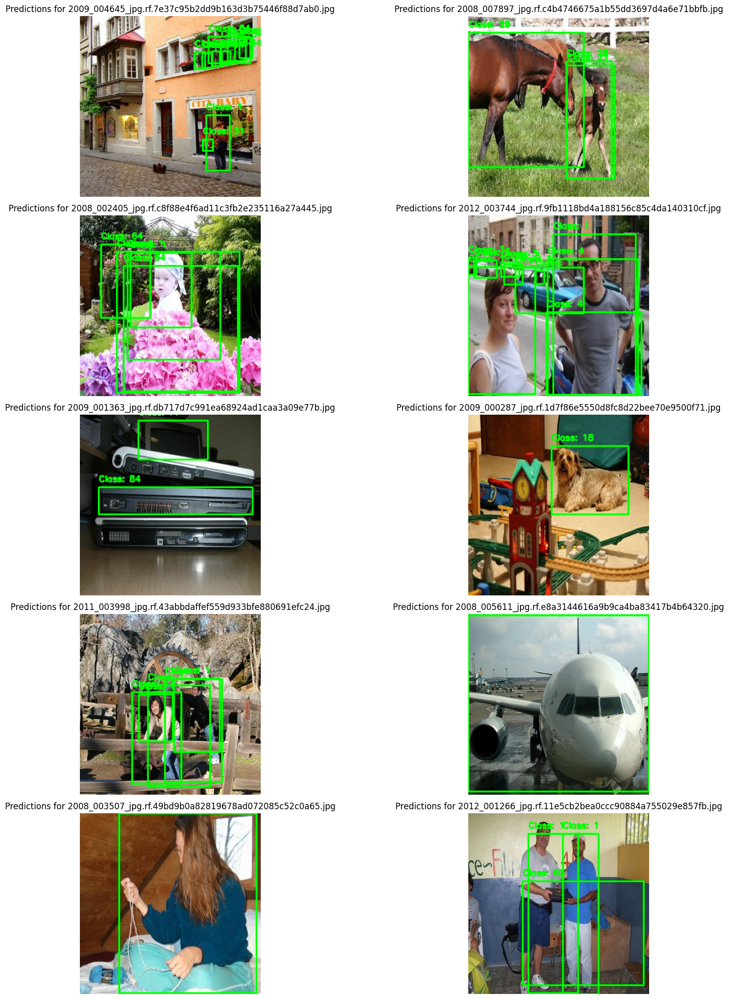

In [ ]:
visualize_predictions(all_predictions)

In [ ]:
# Path to the class names file
ssd_class_names_path = "/content/drive/MyDrive/ms_coco_classnames.txt"

# Read the class names from the file
with open(ssd_class_names_path, 'r') as f:
    ssd_class_names = [line.strip() for line in f.readlines()]

# Function to clean each class name
def clean_class_name(class_name):
    # Remove unwanted characters using regex, including commas
    cleaned_name = re.sub(r"^\d+: u'|{|\}|',|,", '', class_name)
    return cleaned_name.strip()

# Cleaned class names list
cleaned_class_names = [clean_class_name(class_name) for class_name in ssd_class_names]

# Print cleaned SSD Class Names with restarted numbering
print("Cleaned SSD Class Names:")
for i, class_name in enumerate(cleaned_class_names, start=1):  # Restart numbering from 1
    print(f"{i}: {class_name}")

Cleaned SSD Class Names:
1: 0: u'__background__
2: person
3: bicycle
4: car
5: motorcycle
6: airplane
7: bus
8: train
9: truck
10: boat
11: traffic light
12: fire hydrant
13: stop sign
14: parking meter
15: bench
16: bird
17: cat
18: dog
19: horse
20: sheep
21: cow
22: elephant
23: bear
24: zebra
25: giraffe
26: backpack
27: umbrella
28: handbag
29: tie
30: suitcase
31: frisbee
32: skis
33: snowboard
34: sports ball
35: kite
36: baseball bat
37: baseball glove
38: skateboard
39: surfboard
40: tennis racket
41: bottle
42: wine glass
43: cup
44: fork
45: knife
46: spoon
47: bowl
48: banana
49: apple
50: sandwich
51: orange
52: broccoli
53: carrot
54: hot dog
55: pizza
56: donut
57: cake
58: chair
59: couch
60: potted plant
61: bed
62: dining table
63: toilet
64: tv
65: laptop
66: mouse
67: remote
68: keyboard
69: cell phone
70: microwave
71: oven
72: toaster
73: sink
74: refrigerator
75: book
76: clock
77: vase
78: scissors
79: teddy bear
80: hair drier
81: toothbrush'


In [ ]:
# Load predictions from JSON file
predictions_file = "/content/predictions.json"  # Path to your predictions file

with open(predictions_file, 'r') as f:
    all_predictions = json.load(f)

# Replace class IDs with cleaned class names in predictions
for item in all_predictions:
    for pred in item['predictions']:
        class_id = pred['class_id']

        # Check if class_id is within bounds
        if 0 <= class_id < len(cleaned_class_names):
            # Replace class ID with cleaned class name
            pred['class_name'] = cleaned_class_names[class_id]  # Use class ID to get class name
        else:
            # Handle unknown class ID
            pred['class_name'] = "Unknown"  # Or you could choose to skip this entry

# Optionally save updated predictions to a new JSON file
updated_predictions_file = "/content/updated_predictions.json"
with open(updated_predictions_file, 'w') as f:
    json.dump(all_predictions, f)

print(f"Updated predictions saved to {updated_predictions_file}")

# Print a sample of updated predictions for verification
for item in all_predictions[:5]:
    print(f"Filename: {item['filename']}")
    for pred in item['predictions']:
        print(f"Class Name: {pred.get('class_name', 'N/A')}, Bounding Box: {pred['bbox']}, Score: {pred['score']:.2f}")

Updated predictions saved to /content/updated_predictions.json
Filename: 2009_004645_jpg.rf.7e37c95b2dd9b163d3b75446f88d7ab0.jpg
Class Name: person, Bounding Box: [223.03062438964844, 175.33180236816406, 265.94566345214844, 273.00323486328125], Score: 0.83
Class Name: laptop, Bounding Box: [247.4554443359375, 62.131595611572266, 266.4006805419922, 86.0089111328125], Score: 0.63
Class Name: laptop, Bounding Box: [261.54762268066406, 41.60715103149414, 293.7467956542969, 79.86113548278809], Score: 0.62
Class Name: laptop, Bounding Box: [249.3263053894043, 46.206626892089844, 274.611873626709, 80.12603759765625], Score: 0.62
Class Name: laptop, Bounding Box: [282.1038818359375, 39.921581745147705, 305.64117431640625, 74.5212459564209], Score: 0.57
Class Name: laptop, Bounding Box: [233.26128005981445, 62.6474666595459, 251.76763534545898, 88.16781997680664], Score: 0.56
Class Name: skis, Bounding Box: [217.2079849243164, 218.02459716796875, 235.1416015625, 238.63872528076172], Score: 0.55

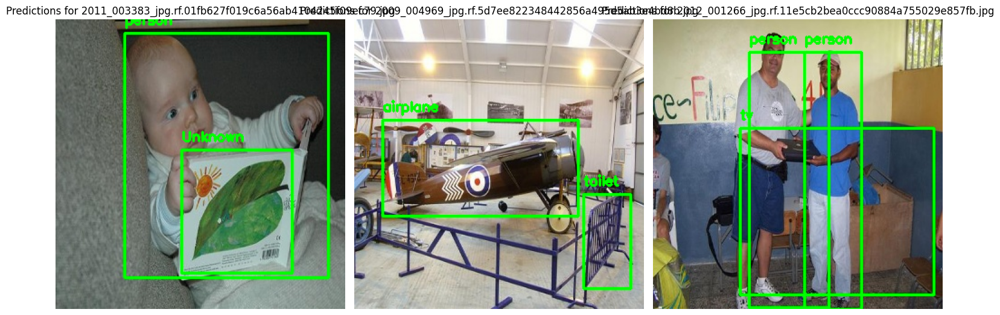

In [ ]:
# Load predictions from JSON file
updated_predictions_file = "/content/updated_predictions.json"  # Ensure this path is correct
with open(updated_predictions_file, 'r') as f:
    all_predictions = json.load(f)

# Function to visualize specific predictions based on provided indices
def visualize_predictions(predictions, indices):
    plt.figure(figsize=(15, 15))  # Set figure size for multiple images

    for i, index in enumerate(indices):  # Use provided indices
        if index < len(predictions):  # Check if index is valid
            item = predictions[index]
            filename = item['filename']
            image_path = f"/content/saved_detections/{filename}"  # Adjust path if necessary

            # Load the original image with detections
            image = cv2.imread(image_path)

            if image is not None:
                for pred in item['predictions']:
                    class_name = pred['class_name']
                    bbox = pred['bbox']
                    left, top, right, bottom = map(int, bbox)

                    # Draw bounding box
                    cv2.rectangle(image, (left, top), (right, bottom), (0, 255, 0), 2)

                    # Put class name on the image
                    cv2.putText(image, class_name, (left, top - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

                # Display the image with detections
                plt.subplot(1, len(indices), i + 1)  # Arrange images in a row based on number of indices
                plt.axis('off')
                plt.title(f"Predictions for {filename}")
                plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for displaying

    plt.tight_layout()  # Adjust layout to prevent overlap
    plt.show()

# Example usage: Specify which indices you want to visualize
indices_to_visualize = [11, 10, 9]  # Change these indices to visualize different images

# Call the function to visualize specified predictions
visualize_predictions(all_predictions, indices_to_visualize)

In [ ]:
# Load class names from data.yaml
data_yaml_path = "/content/dataset2/data.yaml"  # Update this path accordingly
groud_truth_path = '/content/dataset2/valid/labels'

with open(data_yaml_path, 'r') as f:
    data = yaml.safe_load(f)

# Extract class names
class_names = data['names']
print("Class Names:", class_names)

def create_groundtruth_json(label_dir, class_names, output_file):
  ground_truth_data = []

  for filename in os.listdir(label_dir):
      if filename.endswith(".txt"):
          image_filename = filename.replace(".txt", ".jpg")  # Assuming images are .jpg
          label_path = os.path.join(label_dir, filename)

          with open(label_path, 'r') as f:
              lines = f.readlines()

          annotations = []
          for line in lines:
              class_id, x_center, y_center, width, height = map(float, line.split())
              annotations.append({
                  "class_id": int(class_id),
                  "class_name": class_names[int(class_id)],
                  "bbox": [x_center, y_center, width, height]
              })

          ground_truth_data.append({
              "filename": image_filename,
              "annotations": annotations
          })

  with open(output_file, 'w') as f:
      json.dump(ground_truth_data, f, indent=2)


# Example usage:
create_groundtruth_json(groud_truth_path, class_names, "/content/ground_truth.json")

Class Names: ['aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor']


In [ ]:
def load_ground_truths(ground_truth_dir):
    ground_truths = {}
    for filename in os.listdir(ground_truth_dir):
        if filename.endswith('.txt'):
            with open(os.path.join(ground_truth_dir, filename), 'r') as f:
                lines = f.readlines()
            # Extract class IDs and bounding boxes
            gt_data = []
            for line in lines[2:]:  # Skip the first two lines (nc and names)
                parts = list(map(float, line.strip().split()))
                class_id = int(parts[0])  # The first number is the class ID
                bbox = parts[1:]  # The rest are the bounding box coordinates
                gt_data.append({"class_id": class_id, "bbox": bbox})
            ground_truths[filename] = gt_data
    return ground_truths

# Load ground truths from the specified directory
ground_truth_path = '/content/dataset2/valid/labels'
ground_truths = load_ground_truths(ground_truth_path)

# Print loaded ground truths for verification
for filename, gt in ground_truths.items():
    print(f"{filename}: {gt}")

2010_006643_jpg.rf.67f82e77c96f46d139326f57ce87060a.txt: []
2008_000493_jpg.rf.08bc06b559131c19007c8661221b894a.txt: [{'class_id': 14, 'bbox': [0.683, 0.5346666666666666, 0.114, 0.216]}, {'class_id': 17, 'bbox': [0.499, 0.584, 0.998, 0.8266666666666667]}, {'class_id': 10, 'bbox': [0.787, 0.15866666666666668, 0.27, 0.31733333333333336]}, {'class_id': 8, 'bbox': [0.942, 0.21333333333333335, 0.112, 0.21333333333333335]}]
2008_002144_jpg.rf.d995437a1f8d5f3df6ab335c18249973.txt: [{'class_id': 14, 'bbox': [0.338, 0.6493333333333333, 0.356, 0.696]}]
2011_002031_jpg.rf.0ade52727f83db0632289b3df8bd5463.txt: []
2008_003843_jpg.rf.6764d82a52b3ede70e42b9b60a7d5bfc.txt: []
2011_001815_jpg.rf.1caecce6960b4e4b6e707b7795b31f67.txt: [{'class_id': 14, 'bbox': [0.039, 0.40540540540540543, 0.05, 0.12612612612612611]}, {'class_id': 14, 'bbox': [0.082, 0.4069069069069069, 0.072, 0.12312312312312312]}, {'class_id': 14, 'bbox': [0.138, 0.4039039039039039, 0.072, 0.11711711711711711]}, {'class_id': 14, 'bbox':

In [ ]:
# Load predictions from JSON file
updated_predictions_file = "/content/updated_predictions.json"  # Path to your updated predictions file

with open(updated_predictions_file, 'r') as f:
    all_predictions = json.load(f)

# Print a sample of loaded predictions for verification
for item in all_predictions[:5]:  # Print first 5 items for verification
    print(f"Filename: {item['filename']}")
    for pred in item['predictions']:
        print(f"Class ID: {pred['class_id']}, Class Name: {pred.get('class_name', 'N/A')}, Bounding Box: {pred['bbox']}, Score: {pred['score']:.2f}")

Filename: 2009_004645_jpg.rf.7e37c95b2dd9b163d3b75446f88d7ab0.jpg
Class ID: 1, Class Name: person, Bounding Box: [223.03062438964844, 175.33180236816406, 265.94566345214844, 273.00323486328125], Score: 0.83
Class ID: 64, Class Name: laptop, Bounding Box: [247.4554443359375, 62.131595611572266, 266.4006805419922, 86.0089111328125], Score: 0.63
Class ID: 64, Class Name: laptop, Bounding Box: [261.54762268066406, 41.60715103149414, 293.7467956542969, 79.86113548278809], Score: 0.62
Class ID: 64, Class Name: laptop, Bounding Box: [249.3263053894043, 46.206626892089844, 274.611873626709, 80.12603759765625], Score: 0.62
Class ID: 64, Class Name: laptop, Bounding Box: [282.1038818359375, 39.921581745147705, 305.64117431640625, 74.5212459564209], Score: 0.57
Class ID: 64, Class Name: laptop, Bounding Box: [233.26128005981445, 62.6474666595459, 251.76763534545898, 88.16781997680664], Score: 0.56
Class ID: 31, Class Name: skis, Bounding Box: [217.2079849243164, 218.02459716796875, 235.1416015625

In [ ]:
# Load predictions and ground truths
with open("/content/updated_predictions.json", "r") as f:
    predictions = json.load(f)
with open("/content/ground_truth.json", "r") as f:
    ground_truths = json.load(f)

# Define IoU function
def calculate_iou(pred_box, gt_box):
    pred = box(*pred_box)
    gt = box(*gt_box)
    intersection = pred.intersection(gt).area
    union = pred.area + gt.area - intersection
    return intersection / union if union > 0 else 0

# Define evaluation metrics
iou_threshold = 0.5
TP, FP, FN = 0, 0, 0
for pred in predictions:
    # Filter predictions by class name
    filtered_preds = [p for p in pred['predictions'] if p['class_name'] in class_names]
    pred['predictions'] = filtered_preds

    # Get the corresponding ground truth
    gt = next((g for g in ground_truths if g['filename'] == pred['filename']), None)
    if gt:
        # Filter ground truth by class name
        gt['annotations'] = [g for g in gt['annotations'] if g['class_name'] in class_names]

# Define IoU threshold and initialize counters
iou_threshold = 0.5
TP, FP, FN = 0, 0, 0

def normalize_bbox(bbox, img_width, img_height):
    x_min, y_min, x_max, y_max = bbox
    return [x_min / img_width, y_min / img_height, (x_max - x_min) / img_width, (y_max - y_min) / img_height]

# Evaluation loop with adjustments
for pred in predictions:
    gt = next((g for g in ground_truths if g['filename'] == pred['filename']), None)
    if not gt:
        print(f"No ground truth found for {pred['filename']}")
        FP += len(pred['predictions'])
        continue

    # Assume image dimensions for normalization, if known
    img_width, img_height = 320, 320  # replace with actual dimensions if available
    matched_gts = []
    for p in pred['predictions']:
        # Normalize prediction bbox if needed
        p_bbox = normalize_bbox(p['bbox'], img_width, img_height)

        best_iou = 0
        best_gt = None
        for g in gt['annotations']:
            if g['class_name'] == p['class_name']:  # Match by class_name
                iou = calculate_iou(p_bbox, g['bbox'])  # Compare normalized boxes
                if iou > best_iou:
                    best_iou, best_gt = iou, g

        if best_iou >= iou_threshold:
            TP += 1
            matched_gts.append(best_gt)
        else:
            FP += 1

    FN += len(gt['annotations']) - len(matched_gts)


## **4. Comparison**

In [ ]:
# Calculate precision, recall, and accuracy
precision = TP / (TP + FP) if (TP + FP) > 0 else 0
recall = TP / (TP + FN) if (TP + FN) > 0 else 0
accuracy = TP / (TP + FP + FN) if (TP + FP + FN) > 0 else 0

print("SSD Performance Metrics")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"Accuracy: {accuracy:.2f}")
print(f"Inference speed per image: {average_inference_time:.4f} seconds")



SSD Performance Metrics
Precision: 0.08
Recall: 0.08
Accuracy: 0.04
Inference speed per image: 0.1933 seconds


In [ ]:
!python val.py --weights /content/yolov5_runs_train2/exp/weights/best.pt --data dataset2/data.yaml  --img 640 --half

val: data=dataset2/data.yaml, weights=['/content/yolov5_runs_train2/exp/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=True, dnn=False
YOLOv5 🚀 v7.0-378-g2f74455a Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7064065 parameters, 0 gradients, 15.9 GFLOPs
val: Scanning /content/yolov5/preprocessed_data/valid/labels... 3422 images, 120 backgrounds, 0 corrupt: 100% 3422/3422 [00:01<00:00, 1748.83it/s]
val: New cache created: /content/yolov5/preprocessed_data/valid/labels.cache
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 107/107 [00:51<00:00,  2.09it/s]
                   all       3422       7835      0.613      0.537      0.571       0.35
    